<a href="https://colab.research.google.com/github/hanasgnt/PCVK_2024_14/blob/main/week5_14.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama  : Hana Sugianto

NIM   : 2241720102

Kelas : 3E

**# No 0. Connect drive**

In [ ]:
from google.colab import drive

# Akses google drive
drive.mount('/content/drive')

**# No 1. Buat Gamma Correction**

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pylab as plt
import numpy as np
import copy

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


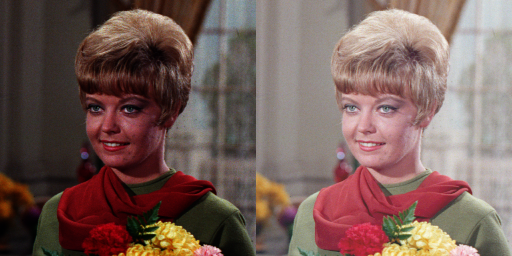

In [ ]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_2024/image/female.tiff')
gama_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      gama_image[y,x,c] = 255*(original[y,x,c]/255)**(1/gamma)

final_frame = cv.hconcat((original, gama_image))
cv2_imshow(final_frame)

**# No 2. Buat Simulasi Image Depth**

Bit Depth pada citra 
----------------------------------
Masukkan nilai Bit Depth: 2


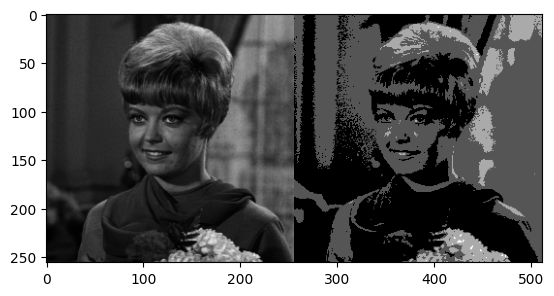

In [102]:
print('Bit Depth pada citra ')
print('----------------------------------')
try:
  bit_depth = int(input('Masukkan nilai Bit Depth: '))
except ValueError:
  print('Error, not a number')

level = 255 / (pow(2, bit_depth)-1)
original = cv.imread('/content/drive/MyDrive/PCVK_2024/image/female.tiff', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    depth_image[y,x] = np.clip(round(original[y,x]/level)*level, 0, 255)

final_frame = cv.hconcat((original, depth_image))
plt.imshow(final_frame, cmap='gray')

**# No 3. Buat Modul Average**

In [ ]:
import glob
import pandas as pd
from math import log10, sqrt

In [ ]:
# Fungsi untuk melakukan Average Denoising
def average_denoising(image_list):
    if len(image_list) == 0:
        raise ValueError("Daftar gambar tidak boleh kosong.")

    avg_img = np.zeros_like(image_list[0], dtype=np.float32)

    for img in image_list:
        avg_img += img.astype(np.float32)

    avg_img /= len(image_list)
    return avg_img.astype(np.uint8)

In [ ]:
# Fungsi untuk menghitung PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0: # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr, mse

Jumlah Citra: 5, PSNR: 28.04 dB


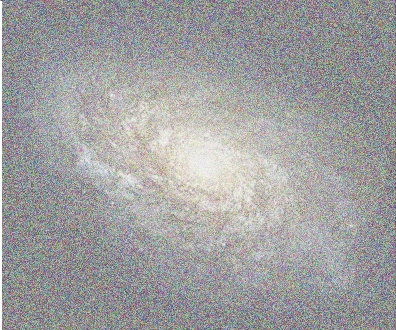

Jumlah Citra: 10, PSNR: 28.08 dB


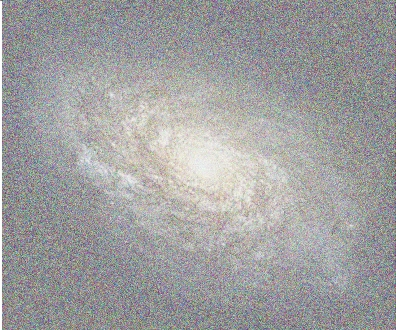

Jumlah Citra: 20, PSNR: 28.14 dB


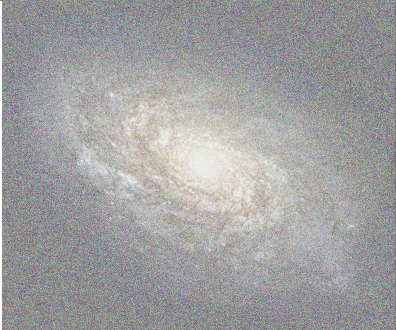

Jumlah Citra: 40, PSNR: 28.17 dB


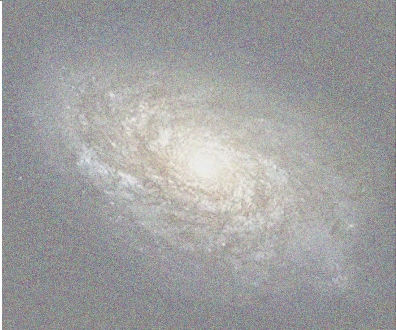

Jumlah Citra: 80, PSNR: 28.11 dB


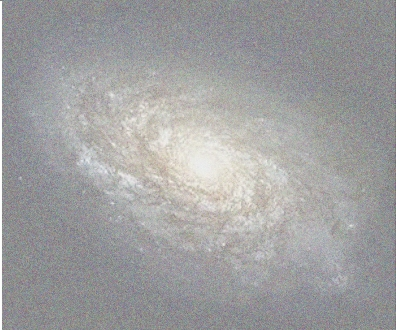

Jumlah Citra: 100, PSNR: 28.08 dB


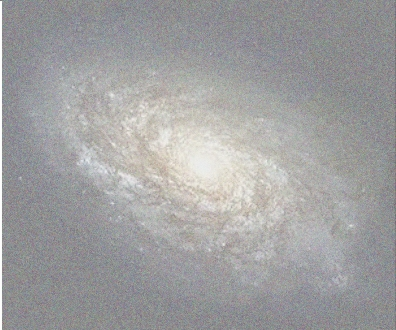


Tabel Hasil Denoising:
   Jumlah Citra  PSNR (dB)         MSE
0             5  28.041578  102.075742
1            10  28.076079  101.268057
2            20  28.136187   99.876117
3            40  28.167310   99.162925
4            80  28.113937  100.389126
5           100  28.075197  101.288611


In [103]:
original_img = cv.imread('/content/drive/MyDrive/dataset/galaxy.jpg')
count = 0
cv_img = []
data = []
for img in glob.glob('/content/drive/MyDrive/dataset/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

if len(cv_img) == 0:
    raise ValueError("Tidak ada gambar dengan noise yang berhasil dimuat!")

# Jumlah citra yang ingin di-average
average_counts = [5, 10, 20, 40, 80, 100]

# Loop untuk proses denoising
for count in average_counts:
    if count > len(cv_img):
        print(f"Jumlah citra yang tersedia lebih sedikit dari {count}. Melewati proses ini.")
        continue

    # Menyiapkan citra untuk di-average
    denoised_image = np.zeros(cv_img[0].shape, dtype=np.float32)

    # Menjumlahkan citra
    for i in range(count):
        denoised_image += cv_img[i].astype(np.float32)

    # Normalisasi untuk mendapatkan citra denoised
    denoised_image = np.uint8(denoised_image / count)

    # Menghitung nilai PSNR
    psnr, mse_value = PSNR(original_img, denoised_image)
    data.append({"Jumlah Citra": count, "PSNR (dB)": psnr, "MSE": mse_value})

    print(f"Jumlah Citra: {count}, PSNR: {psnr:.2f} dB")

    # Menampilkan citra hasil denoising
    cv2_imshow(denoised_image)
    cv.waitKey(0)  # Tekan sembarang tombol untuk lanjut

# Membuat DataFrame dari data yang dikumpulkan
df = pd.DataFrame(data)

# Tampilkan tabel
print("\nTabel Hasil Denoising:")
print(df)

**Kesimpulan yg dapat diambil 🐾**



**# No 4. Buat Image Masking**

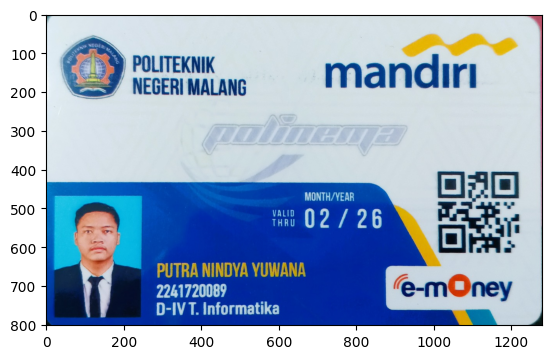

In [105]:
img = cv.imread('/content/drive/MyDrive/PCVK_2024/image/ktm_putrayuwana.jpg')
photo = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(photo)

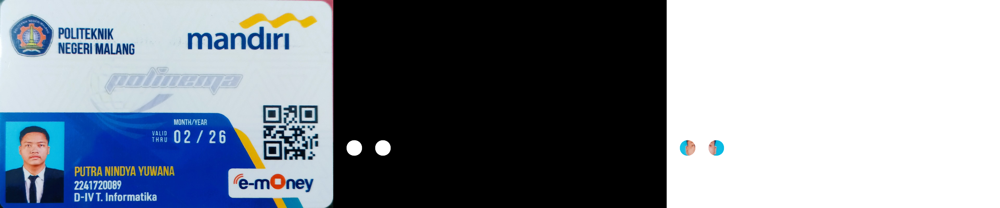

In [ ]:
mask = np.zeros(img.shape, img.dtype)
mask = cv.circle(mask, (80, 570), 30, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype=np.uint8)
mask2 = cv.circle(mask,(190, 570), 30, (255,255,255), -1)

result = img & mask & mask2
result[mask==0] = 255
final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

**# No 5. Percobaan menggunakan operator lain**

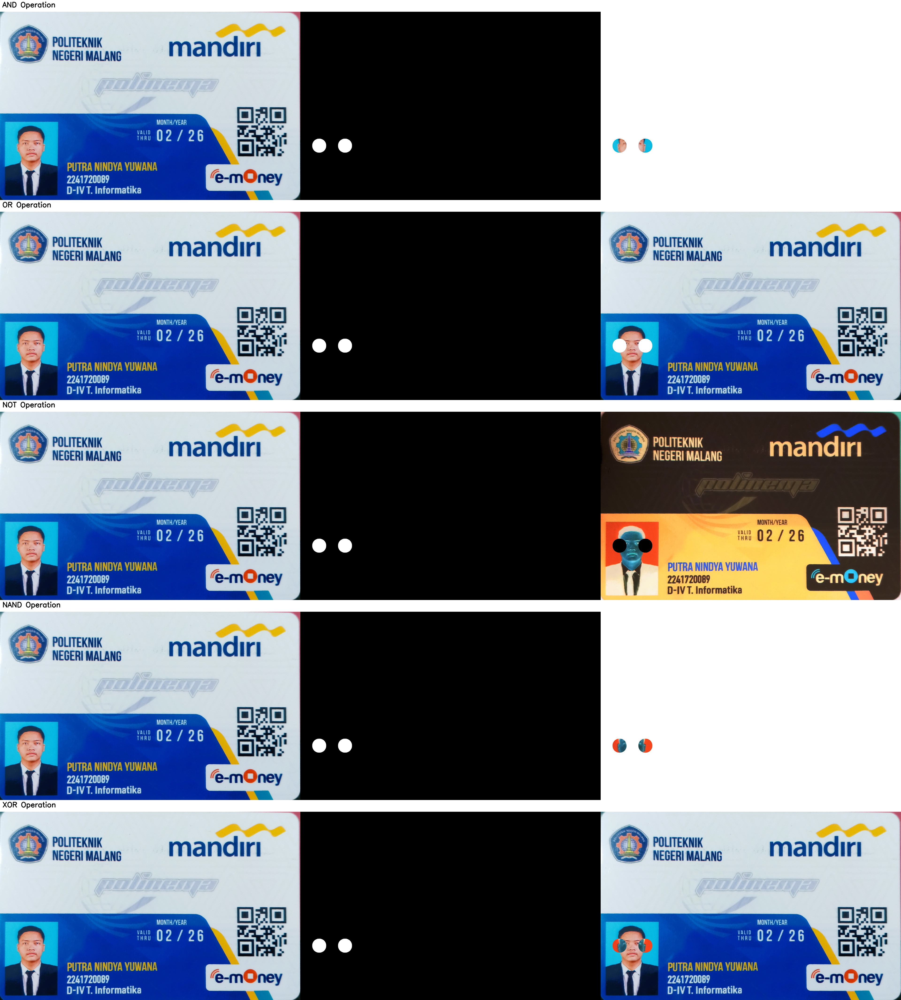

In [106]:
mask = np.zeros(img.shape, img.dtype)
mask = cv.circle(mask, (80, 570), 30, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype=np.uint8)
mask2 = cv.circle(mask,(190, 570), 30, (255,255,255), -1)

# Operasi AND
result_and = img & mask
result_and[mask == 0] = 255

# Bitwise NOT
result_not = ~img & ~mask # Inverts the colors in the image

# Bitwise OR
result_or = img | mask2  # Combines the two masks

# Bitwise XOR
result_xor = img ^ mask2  # Returns the pixels that are different between the two masks

# Bitwise NAND
result_nand = ~(img & mask2)  # Inverts the AND operation

# Fungsi untuk menambahkan teks judul pada gambar
def add_title(image, title):
    # Menyesuaikan ukuran frame judul agar sesuai dengan lebar gambar asli
    width = image.shape[1]
    title_frame = np.zeros((50, width, 3), dtype=np.uint8)
    title_frame[:] = (255, 255, 255)  # Set warna latar belakang hitam

    # Menambahkan teks pada frame judul
    cv.putText(title_frame, title, (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2, cv.LINE_AA)

    # Menggabungkan frame judul dengan gambar
    return cv.vconcat([title_frame, image])

# Menambah judul pada setiap frame hasil operasi
final_and_frame = add_title(cv.hconcat((img, mask2, result_and)), 'AND Operation')
final_or_frame = add_title(cv.hconcat((img, mask2, result_or)), 'OR Operation')
final_not_frame = add_title(cv.hconcat((img, mask2, result_not)), 'NOT Operation')
final_nand_frame = add_title(cv.hconcat((img, mask2, result_nand)), 'NAND Operation')
final_xor_frame = add_title(cv.hconcat((img, mask2, result_xor)), 'XOR Operation')

# Menggabungkan semua hasil ke dalam satu frame besar
all_results_frame = cv.vconcat((final_and_frame, final_or_frame, final_not_frame, final_nand_frame, final_xor_frame))

# Menampilkan hasil keseluruhan dengan judul pada setiap operasi
cv2_imshow(all_results_frame)


**Hasil analisa 🐾**

